# Shape Features based on CellCharter

### Shape Characterization in 2D

#### Assessment of function parameters and interpretation of results
Suitable parameters should be chosen based on the data. Here, we will use an exemplary 2D image.

/tmp/ipykernel_29961/858686024.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', np.unique(color).shape[0]),


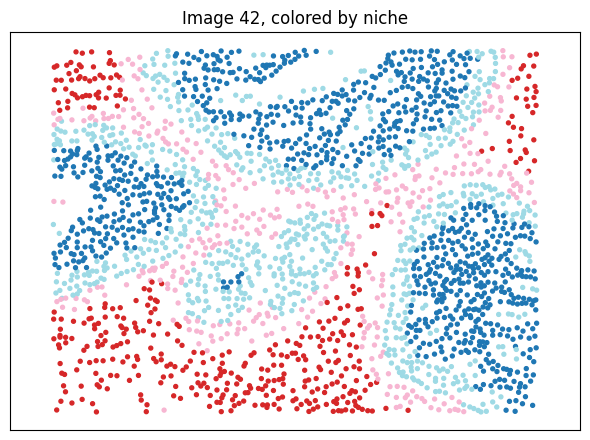

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


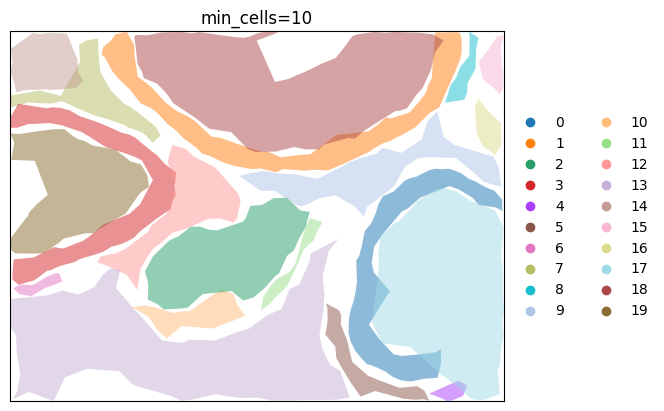

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


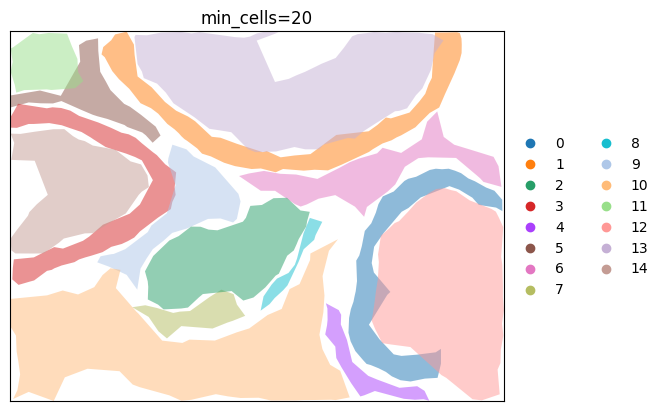

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


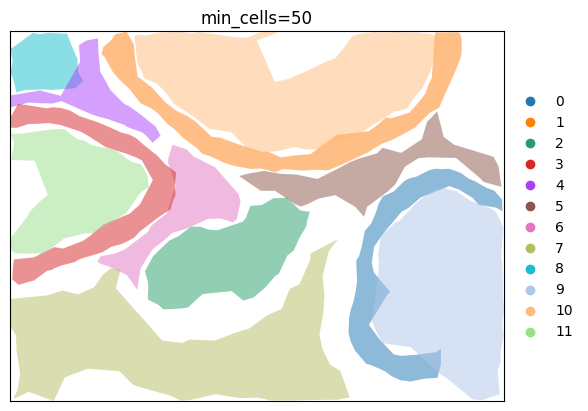

In [ ]:
## Try boundary params: min_cells
min_cells_list = [10,20,50] ## Minimum number of cells in a connected component
alpha_start = 30

imageid = 42
k = 4

cond = adata2.obs['z']==imageid
adata = ad.AnnData(
    X = adata2.X[ cond, : ],
    obs = adata2.obs.loc[ cond, : ],
    obsm = {'spatial' : adata2.obsm['spatial'][ cond, : ]},
    obsp = {'spatial_connectivities': adata2.obsp['spatial_connectivities'][ cond, : ][ :, cond ]}
)

# Plot niche assignments for comparison
color = adata.obs[f'cluster_k{k}'].astype('category')
plt.subplots(figsize=(6,4.5))
plt.title(f'Image {imageid}, colored by niche')
plt.scatter(adata.obsm['spatial'][:,0], 
            adata.obsm['spatial'][:,1] * (-1), ## flip y-axis, as in boundary plot
            c=color,
            cmap = plt.cm.get_cmap('tab20', np.unique(color).shape[0]), 
            s=8)
plt.xticks([])
plt.yticks([])
plt.axis('equal')
plt.tight_layout()
plt.show()

for min_cells in min_cells_list:
    # Identify connected components
    cc.gr.connected_components(adata, cluster_key=f'cluster_k{k}', out_key=f'component_k{k}_{min_cells}cells', min_cells=min_cells)

    # Generate boundary around each connected component, excluding holes
    cc.tl.boundaries(adata, cluster_key=f'component_k{k}_{min_cells}cells', alpha_start=alpha_start)

    # Plot boundaries
    cc.pl.boundaries(adata,
                    library_key='z',
                    sample=imageid,
                    component_key = f'component_k{k}_{min_cells}cells',
                    alpha_boundary=0.5,
                    show_cells=False)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'min_cells={min_cells}')
    plt.show()

/tmp/ipykernel_29961/1978624517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', np.unique(color).shape[0]),


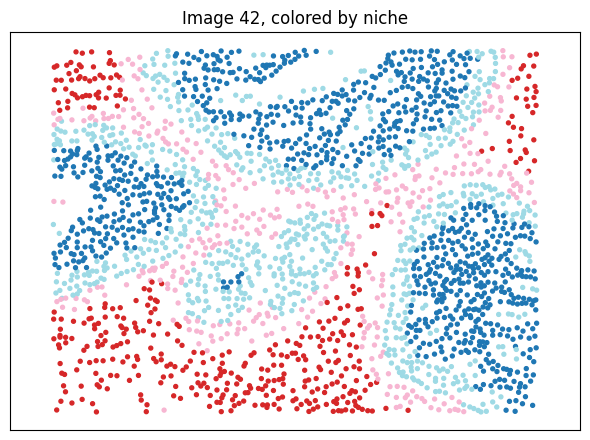

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


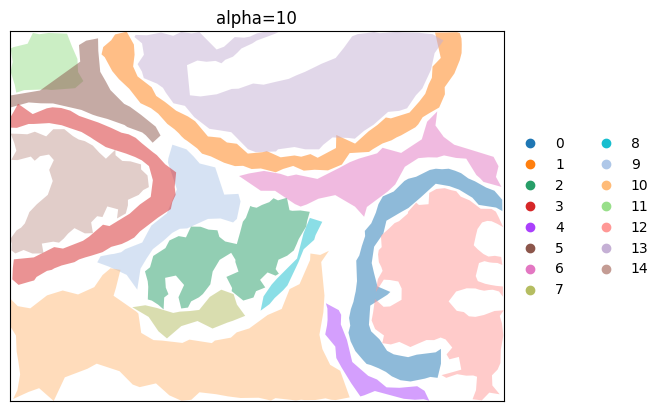

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


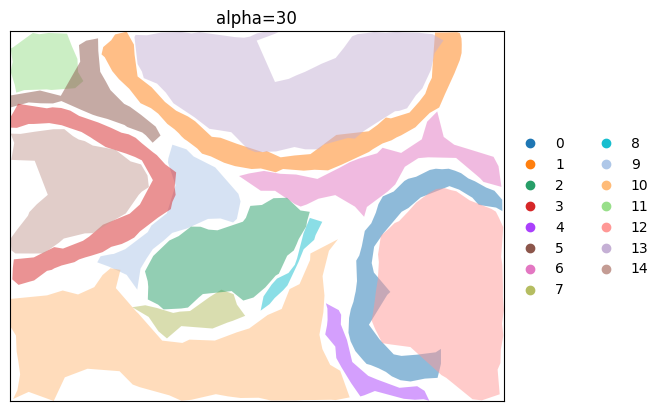

/home/gesa/.py_venv/cellcharter/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:777: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


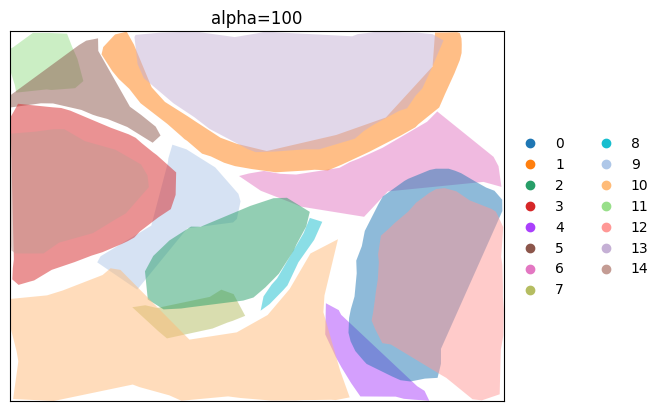

In [ ]:
## Try boundary params: alpha
min_cells = 20 ## Minimum number of cells in a connected component
alphas = [10,30,100]

imageid = 42
k = 4

cond = adata2.obs['z']==imageid
adata = ad.AnnData(
    X = adata2.X[ cond, : ],
    obs = adata2.obs.loc[ cond, : ],
    obsm = {'spatial' : adata2.obsm['spatial'][ cond, : ]},
    obsp = {'spatial_connectivities': adata2.obsp['spatial_connectivities'][ cond, : ][ :, cond ]}
)

# Plot niche assignments for comparison
color = adata.obs[f'cluster_k{k}'].astype('category')
plt.subplots(figsize=(6,4.5))
plt.title(f'Image {imageid}, colored by niche')
plt.scatter(adata.obsm['spatial'][:,0], 
            adata.obsm['spatial'][:,1] * (-1), ## flip y-axis, as in boundary plot
            c=color,
            cmap = plt.cm.get_cmap('tab20', np.unique(color).shape[0]), 
            s=8)
plt.xticks([])
plt.yticks([])
plt.axis('equal')
plt.tight_layout()
plt.show()

# Identify connected components
cc.gr.connected_components(adata, cluster_key=f'cluster_k{k}', out_key=f'component_k{k}_{min_cells}cells', min_cells=min_cells)

for alpha in alphas:
    # Generate boundary around each connected component, excluding holes
    cc.tl.boundaries(adata, cluster_key=f'component_k{k}_{min_cells}cells', alpha_start=alpha)

    # Plot boundaries
    cc.pl.boundaries(adata,
                    library_key='z',
                    sample=imageid,
                    component_key = f'component_k{k}_{min_cells}cells',
                    alpha_boundary=0.5,
                    show_cells=False)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'alpha={alpha}')
    plt.show()

In [ ]:
## Assess shape features
imageid = 42
k = 4

cond = adata2.obs['z']==imageid
adata = ad.AnnData(
    X = adata2.X[ cond, : ],
    obs = adata2.obs.loc[ cond, : ],
    obsm = {'spatial' : adata2.obsm['spatial'][ cond, : ]},
    obsp = {'spatial_connectivities': adata2.obsp['spatial_connectivities'][ cond, : ][ :, cond ]}
)

# Identify connected components
cc.gr.connected_components(adata, cluster_key=f'cluster_k{k}', out_key=f'component_k{k}', min_cells=20)

# Generate boundary around each connected component, excluding holes
cc.tl.boundaries(adata, cluster_key=f'component_k{k}', alpha_start=30)

boundaries = {
    cluster: boundary
    for cluster, boundary in adata.uns[f"shape_{f'component_k{k}'}"]["boundary"].items()
    if cluster in adata.obs[f'component_k{k}'].unique()
}

In [ ]:
# TODO test
import matplotlib as mpl
rcparams_shape = {
    'image.aspect': 'equal',  
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False
}

/home/gesa/Documents/Master/Schapiro/NBH/master_thesis/scripts/submodules/cellcharter_3D/src/cellcharter/tl/_shape.py:578: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sample = adata[adata.obs[cluster_key] == cluster].obs[library_key][0]


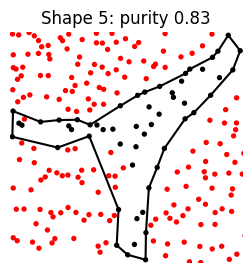

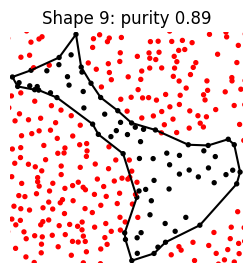

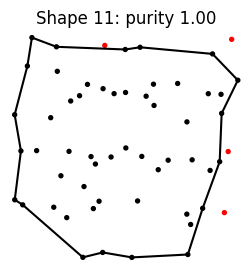

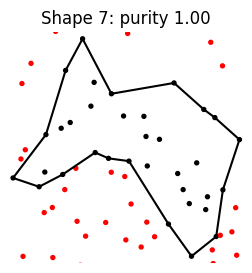

In [ ]:
## Assess purity
cc.tl.purity(adata, library_key='z', cluster_key=f'component_k{k}', exterior=False)

## Plot shapes with low purity
purity = adata.uns[f'shape_component_k{k}']['purity']
purity = sorted(purity.items(), key=lambda x: x[1], reverse=False) ## lowest purity first
sub = [0,1,-2,-1]

for key, value in list(map(lambda i: purity[i], sub)):
    polygon = boundaries[key]
    exterior = np.array(polygon.exterior.xy)

    with mpl.rc_context(rcparams_shape):
        plt.subplots(figsize=(3,3))
        #plt.axis('equal')
        plt.plot(exterior[0], exterior[1], color='black')
        if len( polygon.interiors ):
            for i in len( polygon.interiors ):
                interior = np.array(polygon.interiors[i].xy)
                plt.plot(interior[0], interior[1], color='black')
        plt.scatter(adata.obsm['spatial'][:,0],
                    adata.obsm['spatial'][:,1],
                    c=adata.obs[f'component_k{k}']==key,
                    cmap='flag',
                    s=8)
        plt.xlim(exterior[0].min()-2, exterior[0].max()+2)
        plt.ylim(exterior[1].min()-2, exterior[1].max()+2)
        plt.xticks([])
        plt.yticks([])
        plt.title(f'Shape {key}: purity {value:.2f}')
        plt.show()

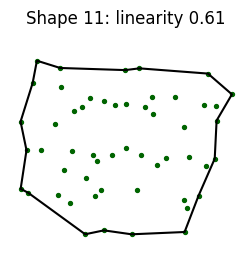

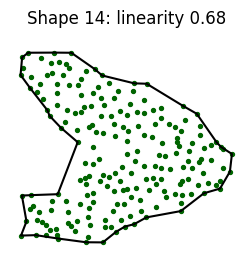

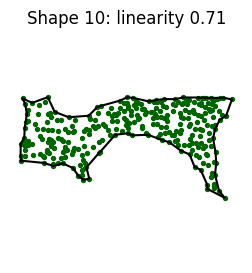

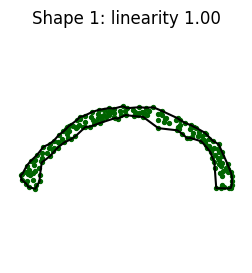

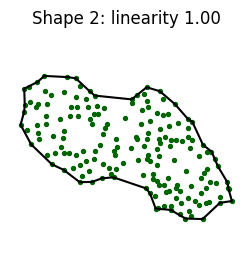

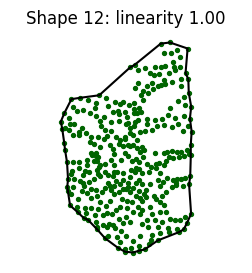

In [ ]:
## Assess linearity
height = 1000 ## Height of the rasterized image (higher = more precise = more computation)
min_ratio = 0.05 ## Minimum ratio between the length of a branch and the total length of the skeleton to be considered a real branch and not be removed

cc.tl.linearity(adata, cluster_key=f'component_k{k}', height=height, min_ratio=min_ratio)
linearity = adata.uns[f'shape_component_k{k}']['linearity'].items()
linearity = sorted(linearity, key = lambda x: x[1])
sub = [0,1,2,-3,-2,-1]

for key, value in list(map(lambda i: linearity[i], sub)):
    polygon = boundaries[key]
    exterior = np.array(polygon.exterior.xy)
    pts = adata.obsm['spatial'][ adata.obs[f'component_k{k}']==key, : ]

    with mpl.rc_context(rcparams_shape):
        plt.subplots(figsize=(3,3))
        plt.axis('equal')
        plt.plot(exterior[0], exterior[1], color='black')
        plt.scatter(pts[:,0], pts[:,1], s=8, color='darkgreen')
        plt.title(f'Shape {key}: linearity {value:.2f}')
        plt.xticks([])
        plt.yticks([])
        plt.show()

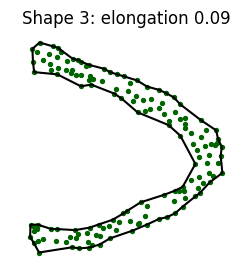

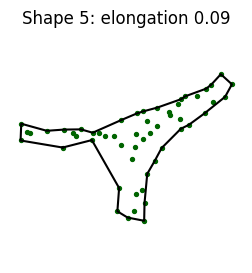

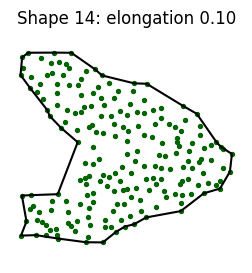

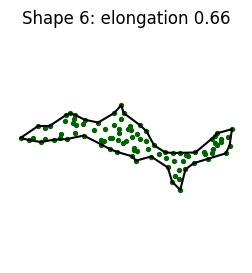

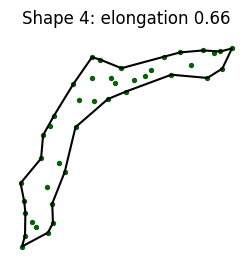

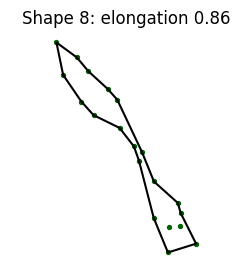

In [ ]:
## Assess elongation
cc.tl.elongation(adata, cluster_key=f'component_k{k}')
elongation = adata.uns[f'shape_component_k{k}']['elongation']
elongation = sorted(elongation.items(), key = lambda x: x[1])
sub = [0,1,2,-3,-2,-1]

for key, value in list(map(lambda i: elongation[i], sub)):
    polygon = boundaries[key]
    exterior = np.array(polygon.exterior.xy)
    pts = adata.obsm['spatial'][ adata.obs[f'component_k{k}']==key, : ]

    with mpl.rc_context(rcparams_shape):
        plt.subplots(figsize=(3,3))
        plt.axis('equal')
        plt.plot(exterior[0], exterior[1], color='black')
        if len( polygon.interiors ):
            for i in len( polygon.interiors ):
                interior = np.array(polygon.interiors[i].xy)
                plt.plot(interior[0], interior[1], color='black')
        plt.scatter(pts[:,0], pts[:,1], s=8, color='darkgreen')
        plt.title(f'Shape {key}: elongation {value:.2f}')
        plt.xticks([])
        plt.yticks([])
        plt.show()

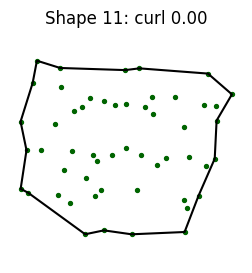

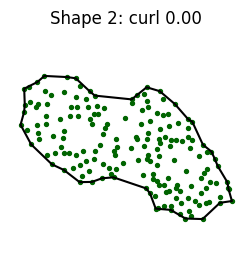

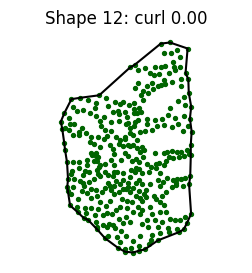

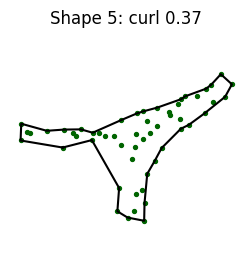

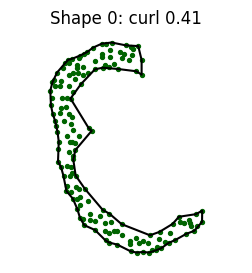

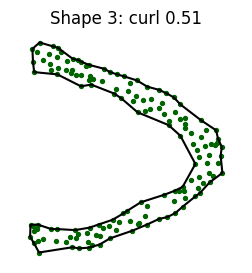

In [ ]:
## Assess curl
cc.tl.curl(adata, cluster_key=f'component_k{k}')
curl = adata.uns[f'shape_component_k{k}']['curl']
curl = sorted(curl.items(), key = lambda x: x[1])
sub = [0,1,2,-3,-2,-1]

for key, value in list(map(lambda i: curl[i], sub)):
    polygon = boundaries[key]
    exterior = np.array(polygon.exterior.xy)
    pts = adata.obsm['spatial'][ adata.obs[f'component_k{k}']==key, : ]

    with mpl.rc_context(rcparams_shape):
        plt.subplots(figsize=(3,3))
        plt.axis('equal')
        plt.plot(exterior[0], exterior[1], color='black')
        if len( polygon.interiors ):
            for i in len( polygon.interiors ):
                interior = np.array(polygon.interiors[i].xy)
                plt.plot(interior[0], interior[1], color='black')
        plt.scatter(pts[:,0], pts[:,1], s=8, color='darkgreen')
        plt.title(f'Shape {key}: curl {value:.2f}')
        plt.xticks([])
        plt.yticks([])
        plt.show()

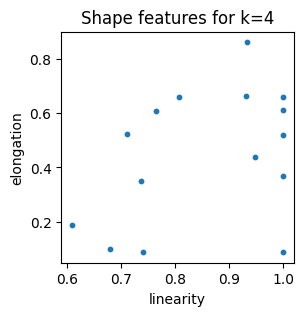

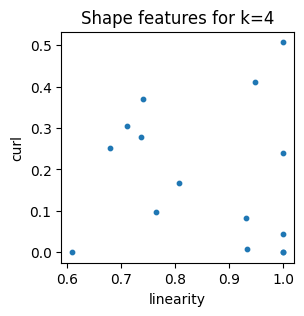

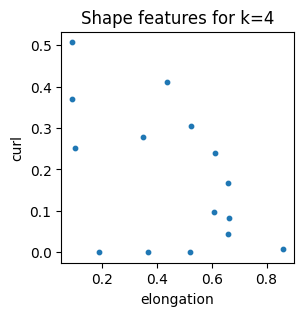

In [ ]:
## Overview plots: linearity, elongation, curl
keys = adata.uns[f'shape_component_k{k}']['boundary'].keys()
shape = pd.DataFrame(index = keys)
shape['linearity'] = [ adata.uns[f'shape_component_k{k}']['linearity'][key] for key in keys ]
shape['elongation'] = [ adata.uns[f'shape_component_k{k}']['elongation'][key] for key in keys ]
shape['curl'] = [ adata.uns[f'shape_component_k{k}']['curl'][key] for key in keys ]

for x, y in [('linearity', 'elongation'), ('linearity', 'curl'), ('elongation', 'curl')]:
    plt.subplots(figsize=(3,3))
    plt.scatter(shape[x], shape[y], s=10)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f'Shape features for k={k}')
    plt.show()

#### Run shape characterization

In [ ]:
## Shape characterization for 2D data
t0 = time.process_time()
#for k in ks:
k = 4
# Identify connected components
min_cells = 20 ## Minimum number of cells in a connected component
cc.gr.connected_components(adata2, cluster_key=f'cluster_k{k}', out_key=f'component_k{k}', min_cells=min_cells)

# Generate boundary around each connected component, excluding holes
alpha_start = 30 ## Starting value for alpha (determines boundary smoothness)
cc.tl.boundaries(adata2, cluster_key=f'component_k{k}', alpha_start=alpha_start)

# Calculate shape features
exterior = False ## If True, the computation of the purity ignores the polygon’s internal holes.
cc.tl.purity(adata2, library_key='z', cluster_key=f'component_k{k}', exterior=exterior)

height = 1000 ## Height of the rasterized image (higher = more precise = more computation)
min_ratio = 0.05 ## Minimum ratio between the length of a branch and the total length of the skeleton to be considered a real branch and not be removed
cc.tl.linearity(adata2, cluster_key=f'component_k{k}', height=height, min_ratio=min_ratio)

cc.tl.elongation(adata2, cluster_key=f'component_k{k}')

cc.tl.curl(adata2, cluster_key=f'component_k{k}')

print("Time elapsed: ", time.strftime('%H:%M:%S', time.gmtime(int(time.process_time()-t0))) )        

/home/gesa/Documents/Master/Schapiro/NBH/master_thesis/scripts/submodules/cellcharter_3D/src/cellcharter/tl/_shape.py:157: RuntimeWarning: invalid value encountered in sqrt
  areas = (s * (s - a) * (s - b) * (s - c)) ** 0.5
/home/gesa/Documents/Master/Schapiro/NBH/master_thesis/scripts/submodules/cellcharter_3D/src/cellcharter/tl/_shape.py:698: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sample = adata[adata.obs[cluster_key] == cluster].obs[library_key][0]


Time elapsed:  00:15:48


In [ ]:
## Sanity check: Proportion of cells with assigned component
for k in ks:
    fraction_na = adata2.obs[f'component_k{k}'].isna().sum() / adata2.obs.shape[0]
    print(f'Fraction of cells not assigned to component for k {k}: {fraction_na:.2f}')

Fraction of cells not assigned to component for k 4: 0.07
Fraction of cells not assigned to component for k 8: 0.18


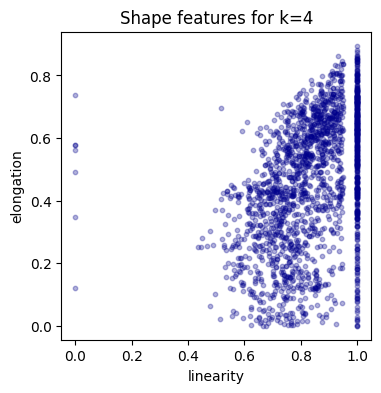

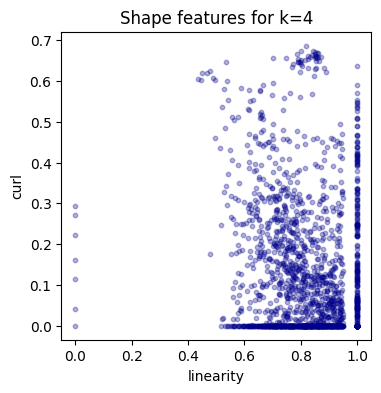

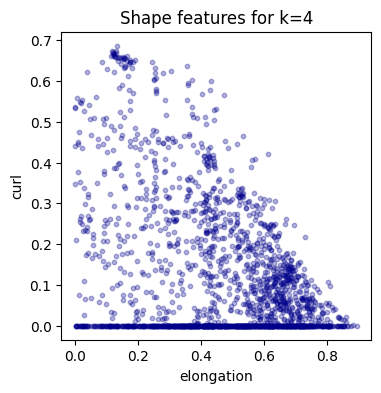

In [ ]:
## Results of shape score on 2D data: linearity, elongation, curl
keys_by_section = adata2.obs.groupby('z', observed=True)[f'component_k{k}'].unique()
shapes = {}
for section in keys_by_section.index:
    keys = [key for key in keys_by_section[section] if not np.isnan(key)]
    shape = pd.DataFrame(index = keys)
    shape['linearity'] = [ adata2.uns[f'shape_component_k{k}']['linearity'][key] for key in keys ]
    shape['elongation'] = [ adata2.uns[f'shape_component_k{k}']['elongation'][key] for key in keys ]
    shape['curl'] = [ adata2.uns[f'shape_component_k{k}']['curl'][key] for key in keys ]
    shapes[section] = shape

for x, y in [('linearity', 'elongation'), ('linearity', 'curl'), ('elongation', 'curl')]:
    plt.subplots(figsize=(4,4))
    for section in keys_by_section.index:
        plt.scatter(shapes[section][x], shapes[section][y],
                    s=10, alpha=.3, label=section, c='darkblue') # to color by imageid, remove c='darkblue'
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f'Shape features for k={k}')
    plt.show()

## Shape Characterization in 3D

#### Function implementation & assessment of function parameters

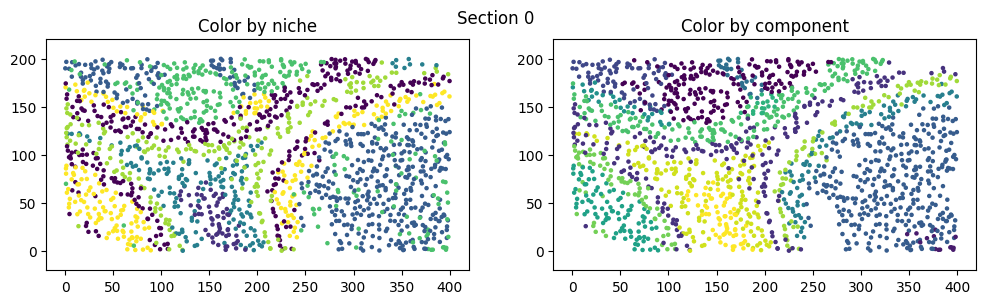

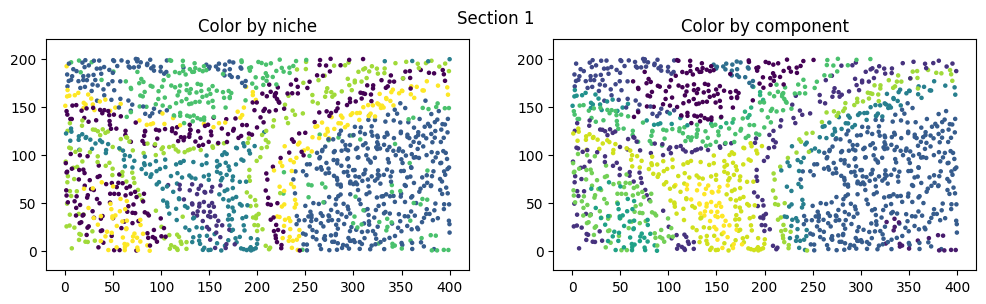

In [ ]:
## Example data
k = 8
cond = (adata3.obsm['spatial'][:,0]<=400) & (adata3.obsm['spatial'][:,1]<=200) & (adata3.obsm['spatial'][:,2]<=30) #& (adata3.obsm['spatial'][:,2]>=30) 
adata = ad.AnnData(
    X = adata3.X[ cond, : ],
    obs = adata3.obs.loc[ cond, ['id', 'imageid', 'ct_broad', f'cluster_k{k}'] ],
    obsm = {'spatial' : adata3.obsm['spatial'][ cond, : ]},
    obsp = {'spatial_connectivities': adata3.obsp['spatial_connectivities'][ cond, : ][ :, cond ]}
)

## Identify connected components
min_cells = 30 ## Minimum number of cells in a connected component
cc.gr.connected_components(adata, cluster_key=f'cluster_k{k}', out_key=f'component_k{k}', min_cells=min_cells)

# Plot
pts = adata.obsm['spatial']
section_size = 15
for i in range(int( pts[:,2].max() // section_size )):
    cond = (pts[:,2] >= section_size*i) & (pts[:,2] <= section_size*(i+1))
    fig, ax = plt.subplots(1,2, figsize=(12,3))
    ax[0].scatter(pts[ cond, 0],
                pts[ cond, 1],
                c=adata.obs.loc[cond, f'cluster_k{k}'],
                s=5)
    ax[0].axis('equal')
    ax[0].set_title('Color by niche')
    ax[1].scatter(pts[ cond, 0],
                pts[ cond, 1],
                c=adata.obs.loc[cond, f'component_k{k}'],
                s=5)
    ax[1].axis('equal')
    ax[1].set_title('Color by component')
    plt.suptitle(f'Section {i}')
    plt.show()

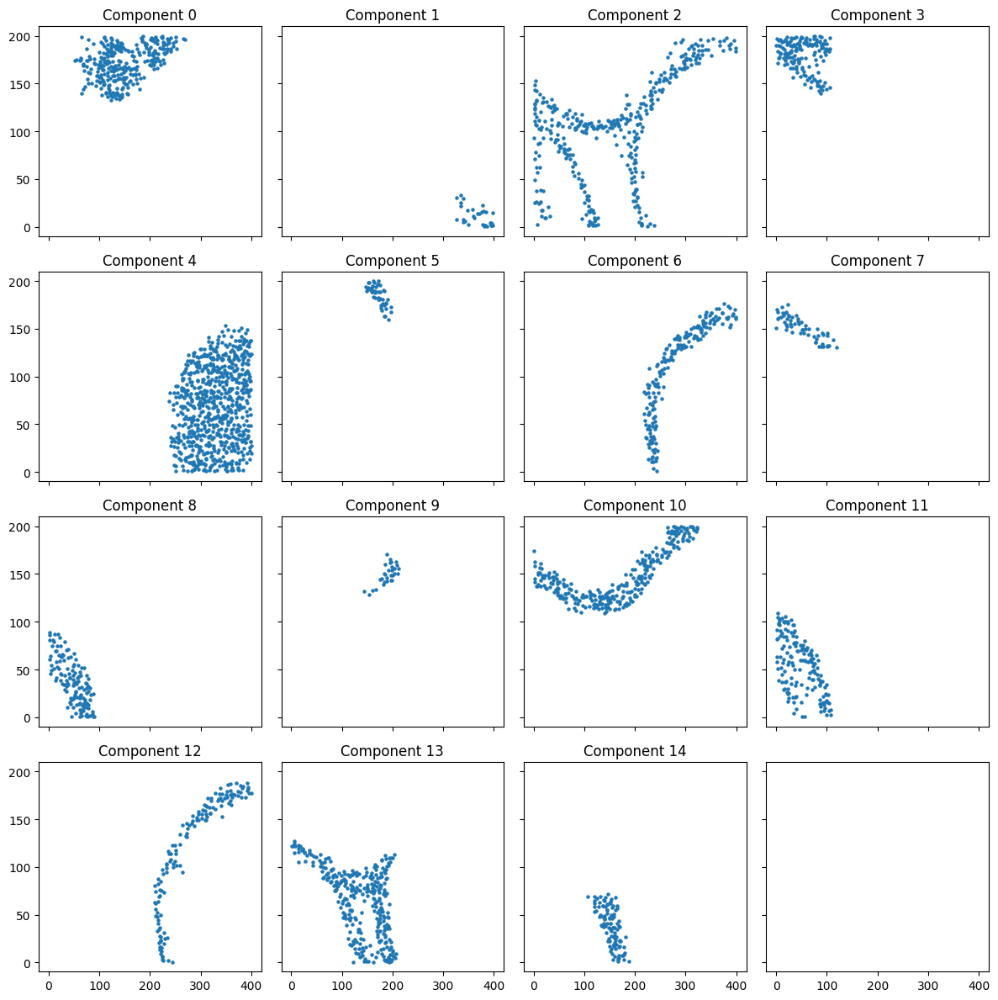

In [ ]:
## Facet plot of components
pts = adata.obsm['spatial']
components = adata.obs[f'component_k{k}'].unique().categories

n = components.size
n_cols = 4
n_rows = np.ceil(n / n_cols).astype(int)
fig, ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3), sharex=True, sharey=True)
for i in range(n_rows):
    for j in range(n_cols):
        if i*n_cols + j >= n:
            break
        cond = adata.obs[f'component_k{k}'] == components[i*n_cols + j]
        ax[i,j].scatter(pts[ cond, 0], pts[ cond, 1], s=5)
        ax[i,j].set_title(f'Component {components[i*n_cols + j]}')
plt.tight_layout()
plt.show()

##### Alpha shape creation (boundary)
The function `cellcharter.tl.boundary` is only implemented for 2D. Since it is based on manual calculation of the boundary and works with `shapely` objects, which are (mostly) 3D incompatible, a full 3D-compatible implementation is necessary.

As in 2D, we want to choose a suitable alpha parameter. The package `alphashape` has a function to find the minimal alpha value that still returns a valid shape. I added the function `cellcharter.tl.alphashape_optimize` to that returns this minimal alpha and the corresponding shape (boundary), see [here](../submodules/cellcharter_3D/src/cellcharter/tl/_shape.py).

Notes:
- The function `alphashape._testalpha` was also modified, since a valid 3D shape should be watertight.
- The definition of alpha is defined differently in the `cellcharter` and `alphashape` packages: Using the `alphashape` package, values closer to zero result in broader shapes, with `alpha = 0` returning the concave hull (in 2D). Using `cellcharter`, the opposite is true. For clarity, we use the `cellcharter` definition and pass the inverse to `alphashape` functions.

In [ ]:
## Find optimal alpha value for exemplary shape
# The resulting alpha and shape might be slightly different than when using cellcharter.tl.boundaries
key = 2

pts = adata.obsm['spatial'][ adata.obs[f'component_k{k}']==key, : ]
alpha_inv = alphashape.optimizealpha(pts)
mesh = alphashape.alphashape(pts, alpha=alpha_inv)
alpha = 1/alpha_inv if alpha > 0 else 2e-308
print(f'Optimal alpha: {alpha}')
mesh.show()

Optimal alpha: 48.20950819502453


In [ ]:
## Modify alpha value to see resulting shape
# e.g., for k = 4, key = 3, alpha must be >= 27.2 to result in valid shape
# e.g., for k = 8, key = 2, alpha must be >= 48.3 to result in valid shape

key = 2 # component key
alpha = 48.3 #150 #15

pts = adata.obsm['spatial'][ adata.obs[f'component_k{k}']==key, : ]
mesh = alphashape.alphashape(pts, alpha=1/alpha)
mesh.show()

alpha: 15.6


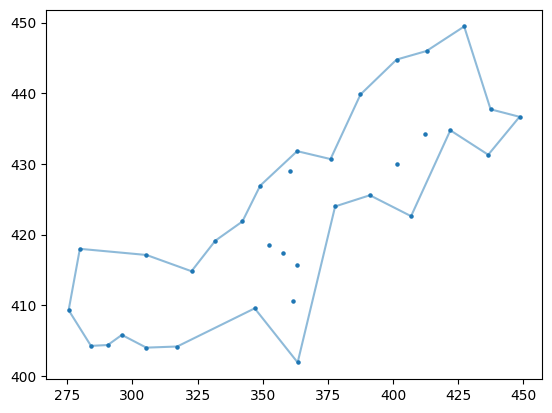

In [ ]:
## Test for small 2D example (for completeness)
key = 1
cond = adata2.obs[f'component_k{k}']==key
adata2_small = ad.AnnData(
    X = adata2.X[ cond, : ],
    obs = adata2.obs.loc[ cond, : ],
    obsm = {'spatial' : adata2.obsm['spatial'][ cond, : ]},
    obsp = {'spatial_connectivities': adata2.obsp['spatial_connectivities'][ cond, : ][ :, cond ]}
)

alpha, shape = cc.tl.alphashape_optimize(adata2_small, component_key=f'component_k{k}', silent=False)

print(f'alpha: {list(alpha.values())[0]:.3}')
fig, ax = plt.subplots()
ax.scatter(*zip(*adata2_small.obsm['spatial']), s=5)
ax.plot(*list(shape.values())[0].exterior.xy, alpha=0.5)
plt.show()

In [ ]:
## Find optimal alpha for each component in test data
# TODO - run (overnight)
alphas, shapes = cc.tl.alphashape_optimize(adata, component_key=f'component_k{k}', silent=False)
alpha_values = np.array(list(alphas.values()))
print(f'{alpha_values.mean():.3} +- {alpha_values.std():.3}')
print(f'min: {alpha_values.min():.3}, max: {alpha_values.max():.3}')

22.2 +- 9.66
min: 13.1, max: 48.2


In [ ]:
## Alternative: Run with set alpha
k = 4
cc.tl.boundaries(adata, cluster_key=f'component_k{k}', alpha_start=30)

In [ ]:
## View exemplary shapes 
# TODO delete comments
# Interesting for curl: 9
# Interesting for elongation: 3, 26 (maybe), 49, 0 (V-shape)
# Interesting for flatness: 5, 10
# Has internal holes: 6
key = 6
mesh = adata3.uns['shape_component_k8']['boundary'][key]
mesh.show()

##### Shape features

The geometric features that CellCharter uses to describe shapes only work for 2D applications. Some of the shape features, like purity, just need to be implemented to work with 3D objects. Other features, like elongation, need to be extended conceptually. Here, we will go through each of the concepts individually, demonstrating them as needed. The final implementation is found in the CellCharter submodule of this repository.

**Purity**: "Ratio between the number of cells of the cluster that are within the boundary and the total number of cells within the boundary" ([CellCharter documentation](https://cellcharter.readthedocs.io/en/latest/generated/cellcharter.tl.purity.html)).

The `trimesh` library has a function implemented to calculate the signed distance of a (set of) points to a mesh object. If the signed distance is positive, the point is contained within the mesh. 

In [ ]:
def purity_3D_bbox(
    adata: ad.AnnData, # TODO AnnData
    cluster_key: str = "component",
    library_key: str = "sample",
    out_key: str = "purity",
    exterior: bool = False,
    copy: bool = False,
    ) -> None | dict[int, float]:
    
    boundaries = adata.uns[f"shape_{cluster_key}"]["boundary"]

    purity_score = {}
    for cluster, boundary in boundaries.items():
        sample = adata[adata.obs[cluster_key] == cluster].obs[library_key][0]
        adata_sample = adata[adata.obs[library_key] == sample]

        points = adata_sample.obsm["spatial"]
        # Which points are contained within boundary?
        # [ 2D code ]
        bbox = boundary.bounding_box
        ((min_x, min_y, min_z), (max_x, max_y, max_z)) = bbox.bounds
        within_box = (points[:,0] >= min_x) & (points[:,0] <= max_x) & (points[:,1] >= min_y) & (points[:,1] <= max_y) & (points[:,2] >= min_z) & (points[:,2] <= max_z)
        is_cluster = adata_sample.obs[cluster_key] == cluster
        points_other = np.array(points)[ within_box & (~is_cluster) , :] 

        within_mask_other = trimesh.proximity.ProximityQuery( boundary ).signed_distance(points_other) > 0

        purity_score[cluster] = np.sum(is_cluster) / ( np.sum(is_cluster) + np.sum(within_mask_other) )

    return purity_score

Purity:  0.54


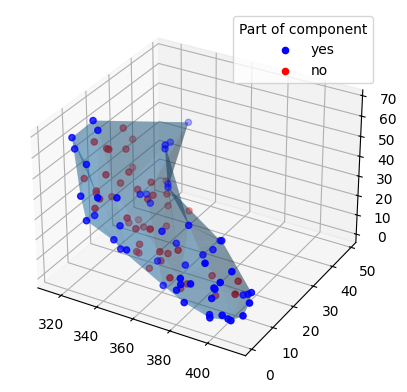

In [ ]:
## Visualize purity
key = 35

def get_impurities(
        mesh: trimesh.Trimesh,
        points: np.ndarray
        ) -> np.ndarray :
    # Subset points to test only those within short distance to shape
    bbox = mesh.bounding_box
    ((min_x, min_y, min_z), (max_x, max_y, max_z)) = bbox.bounds
    within_box = (points[:,0] >= min_x) & (points[:,0] <= max_x) & (points[:,1] >= min_y) & (points[:,1] <= max_y) & (points[:,2] >= min_z) & (points[:,2] <= max_z)
    points_sub = np.array(points)[ within_box , : ]

    # Get signed distances
    return points_sub[ trimesh.proximity.ProximityQuery( mesh ).signed_distance(points_sub) > 0 , : ]


mesh = adata3.uns['shape_component_k8']['boundary'][key]
is_cluster = adata3.obs[f'component_k{k}'] == key
points_cluster = adata3.obsm['spatial'][ is_cluster, : ]
points_other = get_impurities(mesh, np.array(adata3.obsm['spatial'][ ~is_cluster, : ]))

print('Purity: ', points_cluster.shape[0] / (points_cluster.shape[0] + points_other.shape[0]))

# Plot
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2], triangles=mesh.faces, alpha=.3)
ax.scatter(points_cluster[:,0], points_cluster[:,1], points_cluster[:,2], color='blue', label='yes')
ax.scatter(points_other[:,0], points_other[:,1], points_other[:,2], color='red', label='no')
plt.legend(title='Part of component')
plt.show()

Some shape features are very straight-forward to implement, since they rely on inbuilt functions and parameters of trimesh objects. Their definition is found below, the implementation in the submodule.

**Elongation**: $1 - l_1 / l_0$, with $l_1$ and $l_0$ as the lengths of the second longest and longest axes of the oriented bounding box. Range: [ >0, 1 ]

**Flatness**:  $1 - l_2 / l_1$, with $l_2$ and $l_1$ as the lengths of the shortest and second longest axes of the oriented bounding box. Range: [ >0, 1 ]

**Sphericity**:
$$
{\displaystyle \Psi ={\frac {\pi ^{\frac {1}{3}}(6V_{p})^{\frac {2}{3}}}{A_{p}}}}
$$


**Linearity**: "[The function] rasterizes the polygon and computes the skeleton of the rasterized image. Then, it computes the longest path in the skeleton and divides it by the total length of the skeleton. Branches that are shorter than `min_ratio` times the total length of the skeleton are removed because are not considered real branches." ([CellCharter documentation](https://cellcharter.readthedocs.io/en/latest/generated/cellcharter.tl.linearity.html))

Below is a demonstration of the individual steps and intermediary results.

In [ ]:
boundaries = adata3.uns[f"shape_{f'component_k{k}'}"]["boundary"]
boundaries[0]

<trimesh.Trimesh(vertices.shape=(1972, 3), faces.shape=(3938, 3))>

In [ ]:
## Visualize exemplary shape
k = 8
key = 6

mesh = adata3.uns[f'shape_component_k{k}']['boundary'][key]
mesh.show()

5.1901

In [ ]:
# Voxelize (instead of rasterize)
height = 100

# Instead of scaling mesh, adjust voxel length
bbox_sides = mesh.bounding_box.extents # axis-aligned, as voxels will be, too
voxel_length = bbox_sides.max() / height
print('Voxel side length:' str(voxel_length))

# Voxelize the mesh
voxelized = mesh.voxelized(voxel_length)

# Plot the voxelized mesh
voxelized.show()

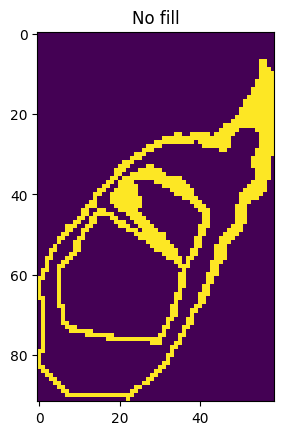

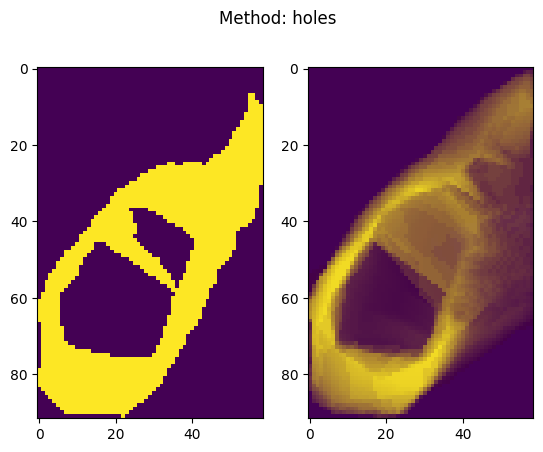

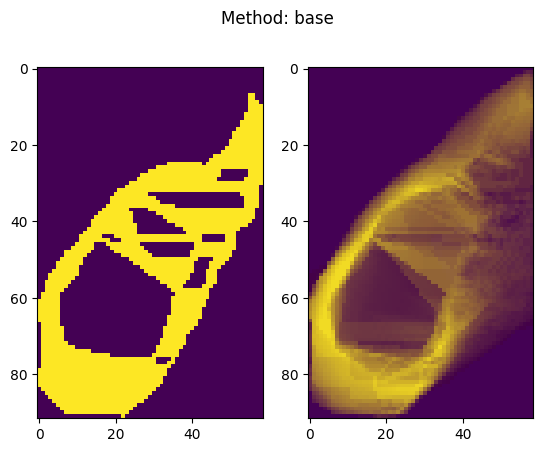

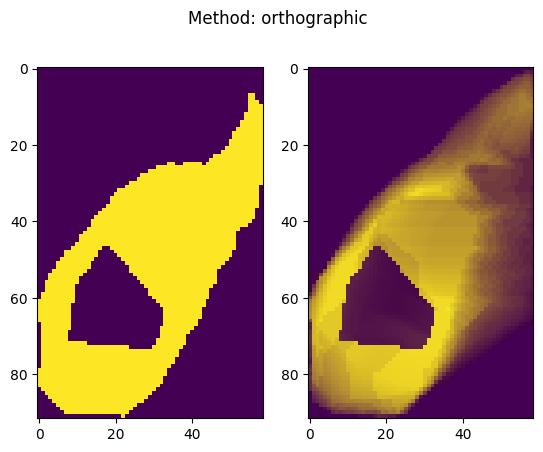

In [ ]:
## Different methods for filling the voxel grid
# example: k = 4, mesh # 49

img = voxelized.matrix*1

section = int(img.shape[0]*.94)

plt.imshow(img[section,:,:])
plt.title('No fill')
plt.show()

for method in ['holes', 'base', 'orthographic']:
    test = voxelized.copy()
    test = test.fill(method=method)
    img = test.matrix*1

    fig, ax = plt.subplots(1,2)
    plt.suptitle('Method: ' + method)
    ax[0].imshow(img[section,:,:])
    for j in range(img.shape[0]):
        ax[1].imshow(img[j, :, :], alpha=.08)
    plt.show()

In [ ]:
## Skeletonize
from skimage.morphology import skeletonize

voxelized = voxelized.fill(method='holes')
img = voxelized.matrix*1
skeleton = skeletonize(img).astype(int) # for 3D, uses method='lee'

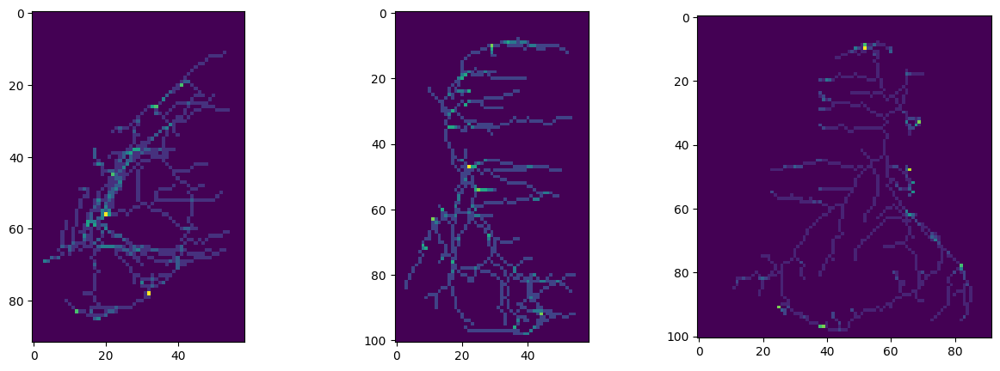

In [ ]:
## Visualize skeleton (unpruned)
fig, ax = plt.subplots(1,3, figsize=(15,5))
for i in range(3):
    ax[i].imshow(skeleton.sum(i))
plt.show()

In [ ]:
## Build graph from skeleton
import sknw
from cellcharter.tl._shape import _remove_dangling_branches, _longest_path_length
import networkx as nx

# Represent skeleton as graph
graph = sknw.build_sknw(skeleton.astype(np.uint16))
graph = graph.to_undirected()
graph0 = graph.copy() ## save for later plotting

# Prune
_remove_dangling_branches(graph, min_ratio=.05)

# Calculate longest path length
cycles = nx.cycle_basis(graph)
cycles_len = [nx.path_weight(graph, cycle + [cycle[0]], "weight") for cycle in cycles]
longest_path_length = _longest_path_length(graph)
longest_length = np.max(cycles_len + [longest_path_length])
print( longest_length / np.sum(list(nx.get_edge_attributes(graph, "weight").values())) )

0.6272202048587703


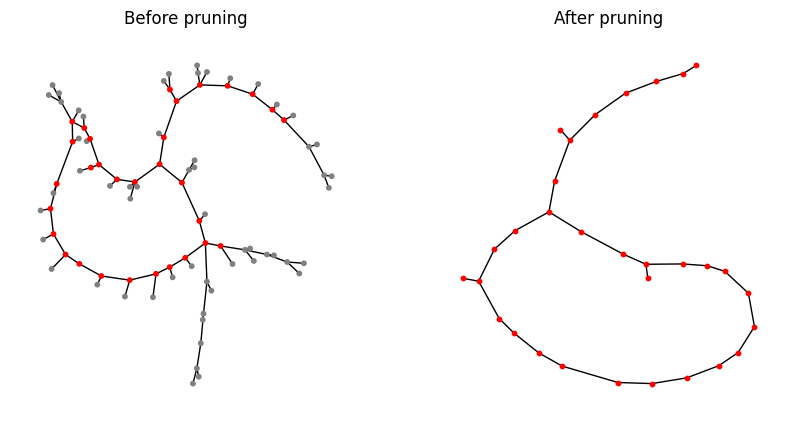

In [ ]:
## Plot graph before and after pruning
colors = np.repeat('grey', np.array(graph0.nodes).size)
colors[ np.array(graph.nodes) ] = 'red'
fig, ax = plt.subplots(1,2, figsize=(10,5))
nx.draw(graph0, pos=nx.spring_layout(graph0, seed=68), ax=ax[0],
        node_size=10, node_color=colors) # alternative seeds: 2, 30, 68
nx.draw(graph, pos=nx.spring_layout(graph, seed=13), ax=ax[1],
        node_size=10, node_color='red') # alternative seeds: 43, 13plt.show()
ax[0].set_title('Before pruning')
ax[1].set_title('After pruning')
plt.show()
# FIXME pruning not working as expected
# TODO how are loops handled?

In [ ]:
# TODO test edge cases for all functions

#### Run shape characterization

In [ ]:
## Identify connected components in all 3D data
min_cells = 30 ## Minimum number of cells in a connected component
for k in ks:
    cc.gr.connected_components(adata3, cluster_key=f'cluster_k{k}', out_key=f'component_k{k}', min_cells=min_cells)

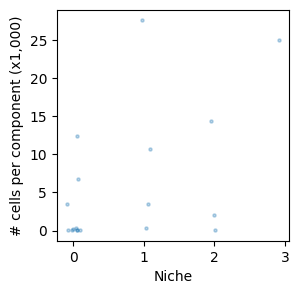

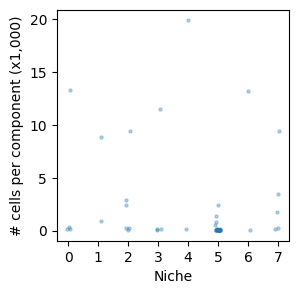

In [ ]:
## How many cells per connected component? Does it correlate with niche?
rng = np.random.default_rng(42)
for k in ks:
    df = adata3.obs.groupby([f'cluster_k{k}',f'component_k{k}'], observed=True).size().reset_index() #[f'cluster_k{k}']
    plt.subplots(figsize=(3,3))
    plt.scatter(df[f'cluster_k{k}'].astype(float).values + rng.uniform(-.1,.1,df.shape[0]), ## add some jitter
                df[0] / 1000,
                s=5, alpha=.3)
    plt.xticks(np.arange(k))
    plt.ylabel('# cells per component (x1,000)')
    plt.xlabel('Niche')
    plt.show()

In [ ]:
## Compute alpha shape
alpha_start = 30
t0 = time.process_time()
for k in ks:
    cc.tl.boundaries(adata3, cluster_key=f'component_k{k}', alpha_start=alpha_start)
print("Time elapsed: ", time.strftime('%H:%M:%S', time.gmtime(int(time.process_time()-t0))) )

Time elapsed:  00:00:01


In [ ]:
## Assess shape features
ks = [4,8]

t0 = time.process_time()
for k in ks:
    cc.tl.purity(adata3, library_key='imageid', cluster_key=f'component_k{k}')
    cc.tl.linearity(adata3, cluster_key=f'component_k{k}')
    cc.tl.flatness(adata3, cluster_key=f'component_k{k}')
    cc.tl.elongation(adata3, cluster_key=f'component_k{k}')
    cc.tl.sphericity(adata3, cluster_key=f'component_k{k}')
    #cc.tl.curl(adata3, cluster_key=f'component_k{k}')
print("Time elapsed: ", time.strftime('%H:%M:%S', time.gmtime(int(time.process_time()-t0))) )

Time elapsed:  00:00:55


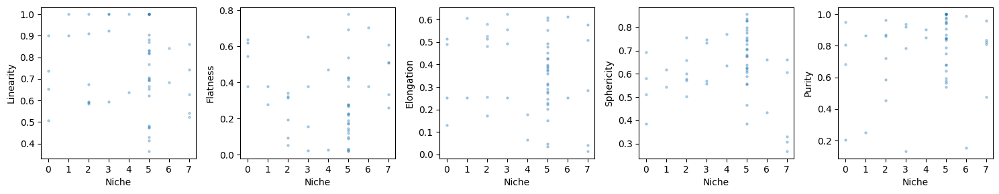

In [ ]:
## Plot score distributions per niche
comp_by_cluster = adata3.obs.groupby([f'component_k{k}', f'cluster_k{k}'], observed=True).size().reset_index(drop=False).sort_values(f'component_k{k}')
keys = comp_by_cluster[f'component_k{k}'].values
niche_per_key = comp_by_cluster[f'cluster_k{k}'].values

shape_features = [ key for key in adata3.uns[f'shape_component_k{k}'].keys() if not key=='boundary']
fig, ax = plt.subplots(1,len(shape_features), figsize=(3*len(shape_features),3))
for i, score in enumerate(shape_features):
    values = np.array([ adata3.uns[f'shape_component_k{k}'][score][key] for key in keys ])
    ax[i].scatter(
        niche_per_key[~np.isnan(values)],
        values[~np.isnan(values)],
        s=5, alpha=.3)
    ax[i].set_xlabel('Niche')
    ax[i].set_ylabel(score.capitalize())
    ax[i].set_xticks(np.arange(k))
plt.tight_layout()
plt.show()

In [ ]:
## Get index of shape with min/max score
keys = list( adata3.uns[f'shape_component_k{k}']['elongation'].keys() )
for score in shape_features:
    min_key = keys[ np.argmin([ adata3.uns[f'shape_component_k{k}'][score][key] for key in keys ]) ]
    min_value = adata3.uns[f'shape_component_k{k}'][score][min_key]
    max_key = keys[ np.argmax([ adata3.uns[f'shape_component_k{k}'][score][key] for key in keys ]) ]
    max_value = adata3.uns[f'shape_component_k{k}'][score][max_key]
    print(f'{score}:\tmin = {min_value:.2} (shape {min_key}),\tmax = {max_value:.2} (shape {max_key})')

linearity:	min = 0.36 (shape 36),	max = 1.0 (shape 4)
flatness:	min = 0.018 (shape 22),	max = 0.78 (shape 27)
elongation:	min = 0.013 (shape 6),	max = 0.62 (shape 3)
sphericity:	min = 0.27 (shape 7),	max = 0.86 (shape 19)
purity:	min = 0.13 (shape 2),	max = 1.0 (shape 16)


In [ ]:
## Visualize exemplary shapes
mesh = adata3.uns[f'shape_component_k{k}']['boundary'][2]
mesh.show()

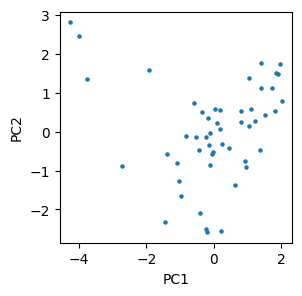

In [ ]:
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA

shape_df = pd.DataFrame(index=keys)
for score in shape_features:
    shape_df[score] = [ adata3.uns[f'shape_component_k{k}'][score][key] for key in keys ]
#shape_df['area'] = [ adata3.uns[f'shape_component_k{k}']['boundary'][key].area for key in keys ]
shape_df['volume'] = [ adata3.uns[f'shape_component_k{k}']['boundary'][key].volume for key in keys ]
shape_df


# Scale (mean to center, unit variance)
# TODO only few shapes have large area & volume -> test with/without/sqrt-transform
shape_df_scaled = pd.DataFrame(scale(shape_df), columns=shape_df.columns, index=shape_df.index)

# PCA
pca = PCA(n_components=2, random_state=42).fit(shape_df_scaled)
shape_pca = pca.transform(shape_df_scaled)

# Plot
plt.subplots(figsize=(3,3))
plt.scatter(shape_pca[:,0], shape_pca[:,1],
            s=5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [ ]:
pca.explained_variance_ratio_

array([0.34733706, 0.25298437])

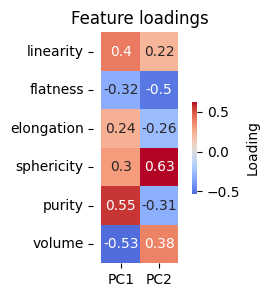

In [ ]:
## Get feature loadings
loadings = pd.DataFrame(pca.components_.T, # alternative definition: pca.components_.T * np.sqrt(pca.explained_variance_)
                        columns=['PC1', 'PC2'], index=shape_df.columns)
plt.subplots(figsize=(1.5,3))
sns.heatmap(loadings, cmap='coolwarm', center=0, annot=True,
            cbar_kws={'label':'Loading', 'shrink':.4})
plt.title('Feature loadings')
plt.axis('equal')
plt.show()

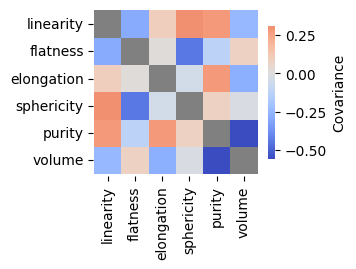

In [ ]:
# Plot covariance matrix
cov = pca.get_covariance()
np.fill_diagonal(cov, np.nan) # mask, so color range is not dominated by diagonal
cmap = sns.color_palette('coolwarm', as_cmap=True)
cmap.set_bad(color='gray')

plt.subplots(figsize=(3.5,2.8))
sns.heatmap(cov,
            mask=np.isnan(cov), 
            square=True,
            cmap=cmap,
            center=0,
            cbar_kws={'label': 'Covariance', 'shrink':.8})
plt.xticks(np.arange(shape_df.columns.size)+.5, shape_df.columns, rotation=90)
plt.yticks(np.arange(shape_df.columns.size)+.5, shape_df.columns, rotation=0)
plt.axis('equal')
plt.tight_layout()
plt.show()

### Save/load data

In [ ]:
## Save AnnData objects (temporarily)
import pickle
k = [4,8]
component_key = 'shape_component_k'

for i, adata_orig in enumerate([adata2, adata3]):
    dim = str(i+2) + 'D'
    adata = adata_orig.copy() ## only change copy of original object
    for k in ks:
        fn_base = "../../data/temp/Kuett_2022_cellcharter_" + dim
        fn_pkl = fn_base + f'_shape_component_k{k}.pkl'
        fn_zarr = fn_base + '.zarr'
        
        # Save shape component separately (dict keys are int, not allowed in zarr)
        shape_component = adata.uns.pop(component_key + str(k))
        with open(fn_pkl, 'wb') as f:
            pickle.dump(shape_component, f) ## save shape component separately

    # Remove other non-zarr compatible elements, if exist
    keys = [ key for key in adata.uns.keys() if key.startswith(component_key) ]
    for key in keys:
        del adata.uns[key]

    adata.write_zarr(fn_zarr) ## save adata to zarr

In [ ]:
## Load AnnData objects
import pickle

def load_results(dim: str, ks: list):
    fn_base = "../../data/temp/Kuett_2022_cellcharter_" + dim
    
    ## Load AnnData object from zarr
    fn_zarr = fn_base + '.zarr'
    adata = ad.read_zarr(fn_zarr)
    
    ## Load shape components from pickle and add to adata.uns
    for k in ks: 
        fn_pkl = fn_base + f'_shape_component_k{k}.pkl'
        with open(fn_pkl, 'rb') as f:
            shape_component = pickle.load(f)
        adata.uns[f'shape_component_k{k}'] = shape_component

    return adata

adata2 = load_results('2D', [4,8])
adata3 = load_results('3D', [4,8])


In [ ]:
import os

os.system("""
    pip freeze > ../../requirements/cellcharter.txt
""")

0